In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={"figure.figsize":(14,9)})
from sklearn.datasets import fetch_openml

In [ ]:
import re
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
raw_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/all_districts_data.csv")

print(raw_data.shape)
raw_data.head(5)

(15844, 15)


,ID,Price,Price per sqm,Address,Rooms,Area,Floor,Date Info,District ID,Latitude,Longitude,Construction Type,Renovation State,Construction Year,Description
0,1.846641e+09,2 914 538 грн,45 551 грн за м²,"проспект Науки, 69",1 кімната,64 / 21 / 18 м²,поверх 22 з 25,сьогодні о 02:12Створено 19 вересня,10026800,50.376064,30.540911,монолітно-каркасний,з ремонтом,2008.0,Пропонується на продаж просторна видова 1к.кв....
1,1.908758e+09,5 620 894 грн,61 081 грн за м²,"вулиця Миколи Бурачека, 3",3 кімнати,92 / 55 / 12 м²,поверх 19 з 24,сьогодні о 07:29Створено 2 жовтня,10026800,50.375561,30.541858,монолітно-каркасний,з ремонтом,2009.0,Продажа квартиры Левитана 3 ( новое название у...
2,NaN,NaN,NaN,"проспект Науки, 55-А",NaN,NaN,NaN,NaN,10026800,50.379524,30.536510,NaN,NaN,NaN,NaN
3,1.902534e+09,3 580 718 грн,44 635 грн за м²,"Моторний провулок, 11",2 кімнати,80.2 / 36 / 11.6 м²,поверх 24 з 25,вчора о 14:03Створено 1 жовтня,10026800,50.378335,30.540408,утеплена панель,з ремонтом,2014.0,НАЙКРАЩА ЦІНА!!!\nМОЖЛИВИЙ ПРОДАЖ ПО ДЕРЖАВНИМ...
4,1.778666e+09,2 456 539 грн,48 174 грн за м²,Ракетна вулиця,1 кімната,51 / 18 / 12 м²,поверх 19 з 25,сьогодні о 02:37Створено 1 вересня,10026800,50.382096,30.540510,панельні,з ремонтом,2019.0,Продам окрему видову однокімнатну квартиру за ...


In [ ]:
df = raw_data.dropna(subset=['ID'])

In [ ]:
print(df.shape)

(13835, 15)


In [ ]:
def extract_number(value):
    if pd.isna(value):
        return np.nan
    value_str = re.sub(r'[^\d.]', '', str(value))
    matches = re.findall(r'\d+(?:\.\d+)?', value_str)
    if matches:
        result = float(''.join(matches))
    else:
        result = np.nan
    return result

def split_area(area_str):
    if pd.isna(area_str):
        return pd.Series([np.nan, np.nan, np.nan])
    areas = area_str.split('/')
    def convert_to_float(a):
        a = a.strip().replace('м²', '').strip()
        return float(a) if a and not a.startswith('-') else np.nan
    return pd.Series([convert_to_float(a) for a in areas + [''] * (3 - len(areas))])

def split_floor(floor_str):
    if pd.isna(floor_str):
        return pd.Series([np.nan, np.nan])
    match = re.search(r'поверх (\d+) з (\d+)', str(floor_str))
    if match:
        return pd.Series([float(match.group(1)), float(match.group(2))])
    return pd.Series([np.nan, np.nan])

# Create a copy of the dataframe for numeric data
df_num = df.copy()

# 1. Clean up Price column
df_num['Price'] = df_num['Price'].apply(extract_number)

# 2. Clean up Price per sqm column
df_num['Price per sqm'] = df_num['Price per sqm'].apply(extract_number)

# 3. Clean up Rooms column
df_num['Rooms'] = df_num['Rooms'].apply(extract_number)

# 4. Split Area into three columns
if 'Area' in df_num.columns:
    df_num[['Area_total', 'Area_living', 'Kitchen_area']] = df_num['Area'].apply(split_area)
    df_num = df_num.drop(columns=['Area'])

# 5. Split Floor into two columns
if 'Floor' in df_num.columns:
    df_num[['Floor', 'Storeys']] = df_num['Floor'].apply(split_floor)
    df_num = df_num.drop(columns=['Floor'])

# Reorder columns if needed
columns_order = ['ID', 'Price', 'Price per sqm', 'Address', 'Rooms', 'Area_total', 'Area_living', 'Kitchen_area',
                 'Storeys', 'Date Info', 'District ID', 'Latitude', 'Longitude',
                 'Construction Type', 'Renovation State', 'Construction Year', 'Description']

# Only include columns that actually exist in the dataframe
existing_columns = [col for col in columns_order if col in df_num.columns]
df_num = df_num[existing_columns]

# Display the first few rows of the new dataframe
print(df_num.head())

# Display the column names
print("\nColumns in the dataframe:")
print(df_num.columns.tolist())

             ID      Price  Price per sqm                    Address  Rooms  \
0  1.846641e+09  2914538.0        45551.0         проспект Науки, 69    1.0   
1  1.908758e+09  5620894.0        61081.0  вулиця Миколи Бурачека, 3    3.0   
3  1.902534e+09  3580718.0        44635.0      Моторний провулок, 11    2.0   
4  1.778666e+09  2456539.0        48174.0             Ракетна вулиця    1.0   
5  1.726124e+09  1207452.0        31103.0       Моторний провулок, 9    1.0   

   Area_total  Area_living  Kitchen_area  Storeys  \
0        64.0         21.0          18.0     25.0   
1        92.0         55.0          12.0     24.0   
3        80.2         36.0          11.6     25.0   
4        51.0         18.0          12.0     25.0   
5        38.8         14.5          13.6     23.0   

                             Date Info  District ID   Latitude  Longitude  \
0  сьогодні о 02:12Створено 19 вересня     10026800  50.376064  30.540911   
1    сьогодні о 07:29Створено 2 жовтня     10026800 

In [ ]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.0/390.0 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 60.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=d279bc093402bc3de7edd41397fe8b0ef5c0ab8c510a240f2bf6fd3fc6ad1908
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport
report = ProfileReport(df_num, explorative=True)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Most of missing values are in the column of "area living". those dont correlate a lot with the price (but correlate with the total apartment area), so i will just drop this column.

some raws dont contain data on rooms, storeys, kitchen area, and geo coordinates - but those are very few. I think its reasonable to dismiss those raws.



In [ ]:
# drop area-living column
df_num = df_num.drop(columns=['Area_living'])
# deleting entries with missing values
df_num = df_num.dropna(subset=['Rooms', 'Kitchen_area', 'Storeys', 'Latitude', 'Longitude'])
df_num.head()

,ID,Price,Price per sqm,Address,Rooms,Area_total,Kitchen_area,Storeys,Date Info,District ID,Latitude,Longitude,Construction Type,Renovation State,Construction Year,Description
0,1.846641e+09,2914538.0,45551.0,"проспект Науки, 69",1.0,64.0,18.0,25.0,сьогодні о 02:12Створено 19 вересня,10026800,50.376064,30.540911,монолітно-каркасний,з ремонтом,2008.0,Пропонується на продаж просторна видова 1к.кв....
1,1.908758e+09,5620894.0,61081.0,"вулиця Миколи Бурачека, 3",3.0,92.0,12.0,24.0,сьогодні о 07:29Створено 2 жовтня,10026800,50.375561,30.541858,монолітно-каркасний,з ремонтом,2009.0,Продажа квартиры Левитана 3 ( новое название у...
3,1.902534e+09,3580718.0,44635.0,"Моторний провулок, 11",2.0,80.2,11.6,25.0,вчора о 14:03Створено 1 жовтня,10026800,50.378335,30.540408,утеплена панель,з ремонтом,2014.0,НАЙКРАЩА ЦІНА!!!\nМОЖЛИВИЙ ПРОДАЖ ПО ДЕРЖАВНИМ...
4,1.778666e+09,2456539.0,48174.0,Ракетна вулиця,1.0,51.0,12.0,25.0,сьогодні о 02:37Створено 1 вересня,10026800,50.382096,30.540510,панельні,з ремонтом,2019.0,Продам окрему видову однокімнатну квартиру за ...
5,1.726124e+09,1207452.0,31103.0,"Моторний провулок, 9",1.0,38.8,13.6,23.0,сьогодні о 02:07Створено 21 серпня,10026800,50.376325,30.540141,NaN,без ремонту,NaN,"Квартира 38,8 продаж по переуступці або можемо..."


Concerning "construction type", around 30% of data is missing - maybe we can fill it in based on median of nearest neighbours.


In [ ]:
from sklearn.neighbors import NearestNeighbors


# Identify entries with missing Construction Type and their coordinates
missing_construction = df_num[df_num['Construction Type'].isnull()][['ID', 'Latitude', 'Longitude']]
coords_missing = missing_construction[['Latitude', 'Longitude']].to_numpy()

# Entries with available Construction Type and their coordinates
existing_construction = df_num[df_num['Construction Type'].notnull()]
coords_existing = existing_construction[['Latitude', 'Longitude']].to_numpy()

# Fit NearestNeighbors model
nbrs = NearestNeighbors(n_neighbors=10).fit(coords_existing)

# Find nearest neighbors for the missing entries
_, indices = nbrs.kneighbors(coords_missing)

# List to store most common Construction Type for each missing entry
most_common_types = []

for idx_list in indices:
    # Get construction types for these indices
    types_found = existing_construction.iloc[idx_list]['Construction Type'].dropna()
    # Determine the most common type
    most_common = types_found.mode()
    if not most_common.empty:
        most_common_types.append(most_common[0])
    else:
        most_common_types.append(None)

missing_construction['Most Common Construction Type'] = most_common_types

# Fill in the missing Construction Type in the original DataFrame
for idx, row in missing_construction.iterrows():
    df_num.loc[df_num['ID'] == row['ID'], 'Construction Type'] = row['Most Common Construction Type']




also, more than 30% of Construction Year entries is missing. However, this feature seems to have some correlation with price, so it seems better to keep it. To fill in the missing values, we'll find the closest possible neighbours and calculate the average of their construction year.

In [ ]:

from math import radians, sin, cos, sqrt, atan2

# Haversine formula to calculate distance between two lat/lon
def haversine(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    return 6371000 * c  # return distance in meters

# Find neighbors and calculate average construction year
def find_neighbors(df_num):
    neighbors_info = {}
    missing_construction_year = df_num[df_num['Construction Year'].isnull()]

    for idx, row in missing_construction_year.iterrows():
        lat1, lon1 = row['Latitude'], row['Longitude']
        df_num['Distance'] = df_num.apply(
            lambda x: haversine(lat1, lon1, x['Latitude'], x['Longitude']), axis=1
        )

        for radius in [100, 200, 500]:
            neighbors = df_num[(df_num['Distance'] <= radius) & df_num['Construction Year'].notnull()]
            if not neighbors.empty:
                neighbors_info[idx] = neighbors['Construction Year'].mean()
                break
        else:
            # If no neighbors found within the specified radii, take the 5 nearest neighbors
            neighbors = df_num[df_num['Construction Year'].notnull()].nsmallest(n=5, columns='Distance')
            neighbors_info[idx] = neighbors['Construction Year'].mean()

    return neighbors_info

# Get the neighbors information
neighbors_info = find_neighbors(df_num)

# Fill in the missing Construction Year values
for idx, average_year in neighbors_info.items():
    df_num.at[idx, 'Construction Year'] = average_year

# Display updated DataFrame where Construction Year was filled
filled_years = df_num[['ID', 'Construction Year']].dropna()
print(filled_years)

                 ID  Construction Year
0      1.846641e+09             2008.0
1      1.908758e+09             2009.0
3      1.902534e+09             2014.0
4      1.778666e+09             2019.0
5      1.726124e+09             2010.4
...             ...                ...
15837  1.871610e+09             1966.0
15838  1.983700e+09             1969.5
15839  1.220011e+09             1969.5
15842  1.054288e+09             1969.5
15843  1.405209e+09             1969.5

[13632 rows x 2 columns]


In [ ]:
null_check=df_num.isnull().sum()
print(null_check)
print("filling NA with \"unknown\"")

ID                    0
Price                 0
Price per sqm         0
Address               0
Rooms                 0
Area_total            0
Kitchen_area          0
Storeys               0
Date Info             0
District ID           0
Latitude              0
Longitude             0
Construction Type     0
Renovation State      0
Construction Year     0
Description          15
Distance              0
dtype: int64
filling NA with "unknown"


obviously, now only some description values are missing, which should be fine. We'll see how to handle those once we get to extracting the text features.

Now, lets check how price and rooms are distributed

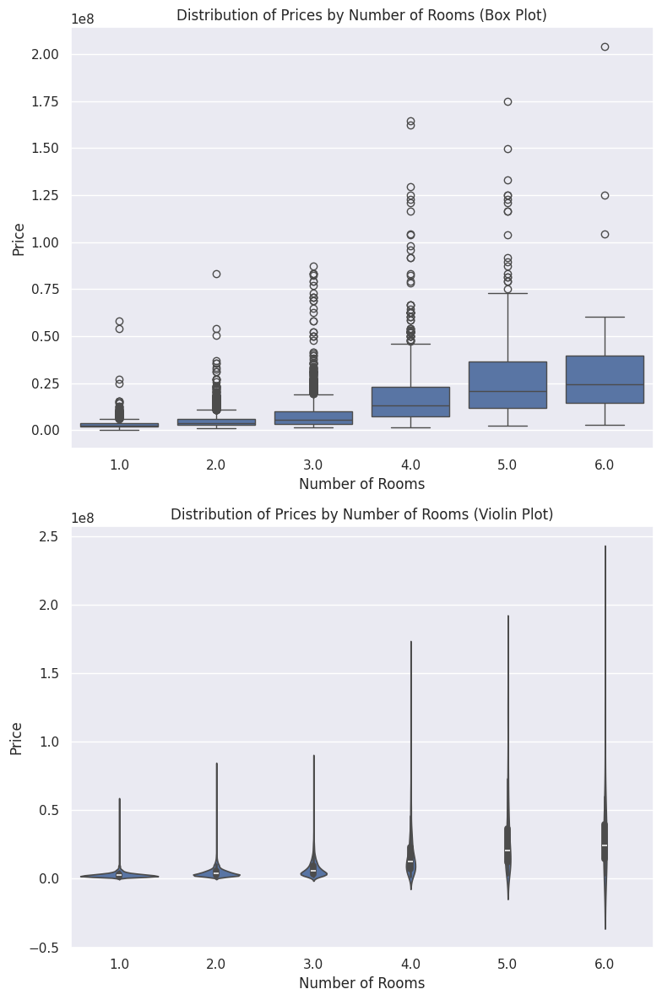

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(8, 12))

# Box plot
sns.boxplot(x='Rooms', y='Price', data=df_num, ax=ax1)
ax1.set_title('Distribution of Prices by Number of Rooms (Box Plot)')
ax1.set_xlabel('Number of Rooms')
ax1.set_ylabel('Price')

# Violin plot
sns.violinplot(x='Rooms', y='Price', data=df_num, ax=ax2)
ax2.set_title('Distribution of Prices by Number of Rooms (Violin Plot)')
ax2.set_xlabel('Number of Rooms')
ax2.set_ylabel('Price')

plt.tight_layout()
plt.show()

we'll apply log to the price to bring the distribution closer to the standard

In [ ]:
df_num['Log_Price'] = np.log1p(df_num['Price'])

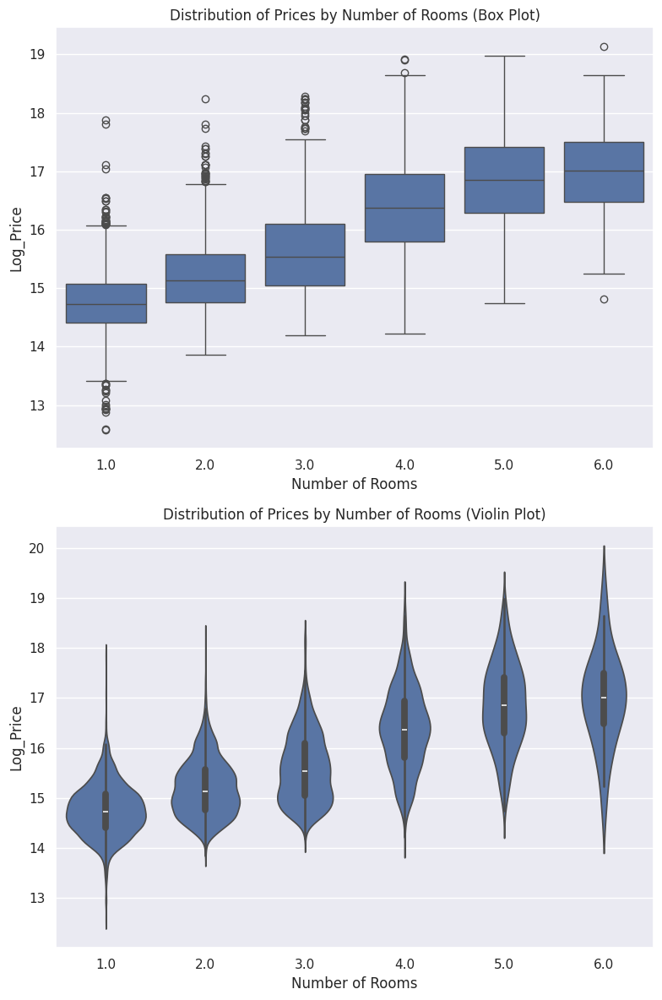

In [ ]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(8, 12))

# Box plot
sns.boxplot(x='Rooms', y='Log_Price', data=df_num, ax=ax1)
ax1.set_title('Distribution of Prices by Number of Rooms (Box Plot)')
ax1.set_xlabel('Number of Rooms')
ax1.set_ylabel('Log_Price')

# Violin plot
sns.violinplot(x='Rooms', y='Log_Price', data=df_num, ax=ax2)
ax2.set_title('Distribution of Prices by Number of Rooms (Violin Plot)')
ax2.set_xlabel('Number of Rooms')
ax2.set_ylabel('Log_Price')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

one could obviously expect that flats with more rooms will cost rather more. However, Its interesting to see that the difference between 3 and 4 rooms is larger than between 2 and 3 rooms. While 5 and 6 rooms are not far apart.

Now, we can check how apartment sizes are distributed in relation to rooms.

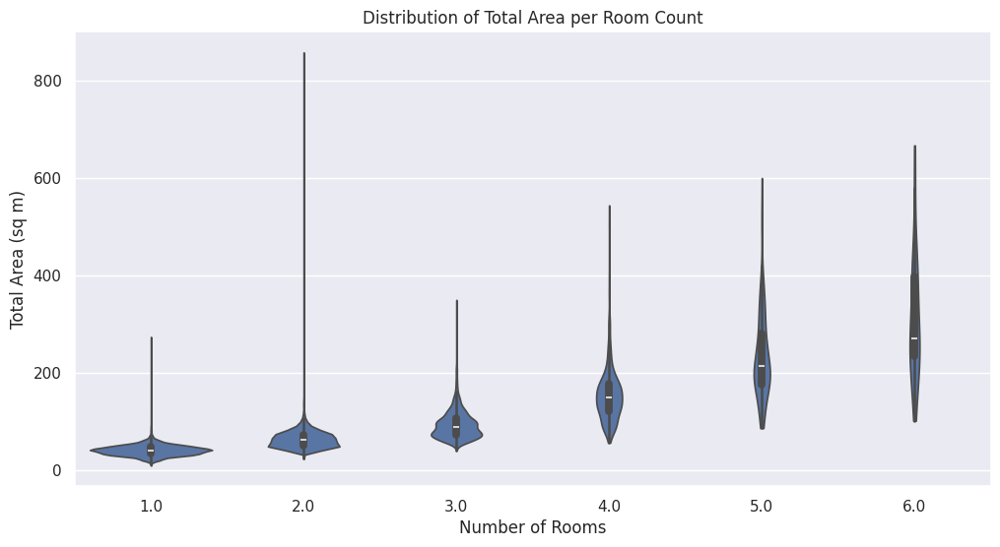

In [ ]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='Rooms', y='Area_total', data=df_num, inner='box', cut=0)
plt.title('Distribution of Total Area per Room Count')
plt.xlabel('Number of Rooms')
plt.ylabel('Total Area (sq m)')
plt.show()

its very interesting to see that each of the "Rooms" obviously has some outliers. We can check a couple of those by their id.


In [ ]:
outliers = df_num[(df_num['Rooms'] == 1) & (df_num['Area_total'] > 120)]

# Get the IDs of these outliers
outlier_ids = outliers['ID'].tolist()

print(f"Number of outliers found: {len(outlier_ids)}")
print("Outlier IDs:")
print(outlier_ids)

Number of outliers found: 168
Outlier IDs:
[1966213968.0, 1110176518.0, 1576469083.0, 422879553.0, 392752406.0, 1805902681.0, 1890708699.0, 1938291556.0, 1874573981.0, 1520049154.0, 1321229175.0, 967455611.0, 1131102707.0, 489537947.0, 392329853.0, 654067574.0, 1912366327.0, 1647658311.0, 1073324564.0, 894741809.0, 652993402.0, 1344581882.0, 1114820903.0, 1689351174.0, 1907462878.0, 1789264513.0, 417556299.0, 1661110457.0, 1059361646.0, 1596009071.0, 1369075280.0, 414221872.0, 1870462383.0, 1174135114.0, 972776232.0, 401493192.0, 1456401697.0, 1370087455.0, 1626905299.0, 1415748942.0, 1941976666.0, 1295687988.0, 1507518619.0, 1971026945.0, 1727083368.0, 1936545247.0, 1937398561.0, 970317252.0, 1724511482.0, 955899478.0, 1622794395.0, 839713291.0, 400472282.0, 1879912126.0, 1602912307.0, 1619403654.0, 1602859182.0, 1572787277.0, 393987074.0, 1057385557.0, 1520045520.0, 710297800.0, 1844447336.0, 738616601.0, 1908427606.0, 1666275265.0, 1871647111.0, 1367746921.0, 1602901298.0, 172230914

After looking through the ads, it appears that apartments can be indeed as small as 10 sqm. However, too large apartments are rather elite objects, which I'd like to exclude for the training. (we'll do this couple of codeblocks lower)

Before excluding however, first it might be important to look at the distribution of the price per sqm.

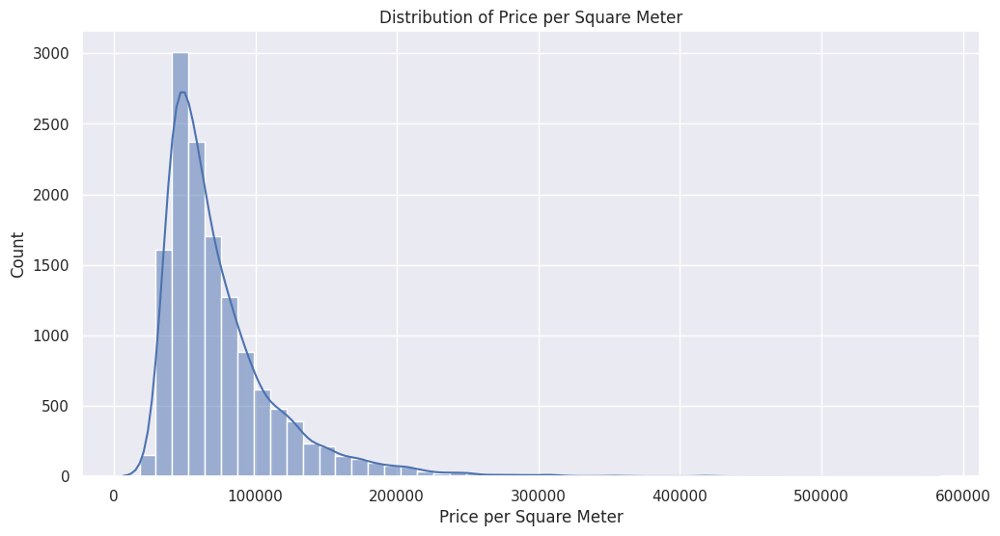

count     13632.000000
mean      75224.209727
std       43052.450391
min        6662.000000
25%       47466.000000
50%       62455.000000
75%       88654.500000
max      583199.000000
Name: Price per sqm, dtype: float64


In [ ]:
plt.figure(figsize=(12, 6))

sns.histplot(data=df_num, x='Price per sqm', kde=True, bins=50)
plt.title('Distribution of Price per Square Meter')
plt.xlabel('Price per Square Meter')
plt.ylabel('Count')

plt.show()

# Print summary statistics
print(df_num['Price per sqm'].describe())

considering the low amount of very expensive (per sqm) apartments, we can get rid of such entries.

In [ ]:
# Calculate mean and standard deviation

mean = df_num['Price per sqm'].mean()
std = df_num['Price per sqm'].std()

# Define outliers as values more than 3 standard deviations from the mean + include domain knowledge
price_outlier = df_num['Price per sqm'] > mean + 3*std
room1_outlier = (df_num['Rooms'] == 1) & (df_num['Area_total'] > 120)
room2_outlier = (df_num['Rooms'] == 2) & (df_num['Area_total'] > 180)
room3_outlier = (df_num['Rooms'] == 3) & (df_num['Area_total'] > 200)
room4_outlier = (df_num['Rooms'] == 4) & (df_num['Area_total'] > 200)
room4_outlier = (df_num['Area_total'] > 400)

outlier_condition = (
    price_outlier |
    room1_outlier |
    room2_outlier |
    room3_outlier |
    room4_outlier
)
# Create a new dataframe without the outliers
df_num_cleaned = df_num[~outlier_condition]

print(f"Number of outliers removed: {outlier_condition.sum()}")
print(f"Rows in original dataframe: {len(df_num)}")
print(f"Rows in cleaned dataframe: {len(df_num_cleaned)}")

Number of outliers removed: 301
Rows in original dataframe: 13632
Rows in cleaned dataframe: 13331


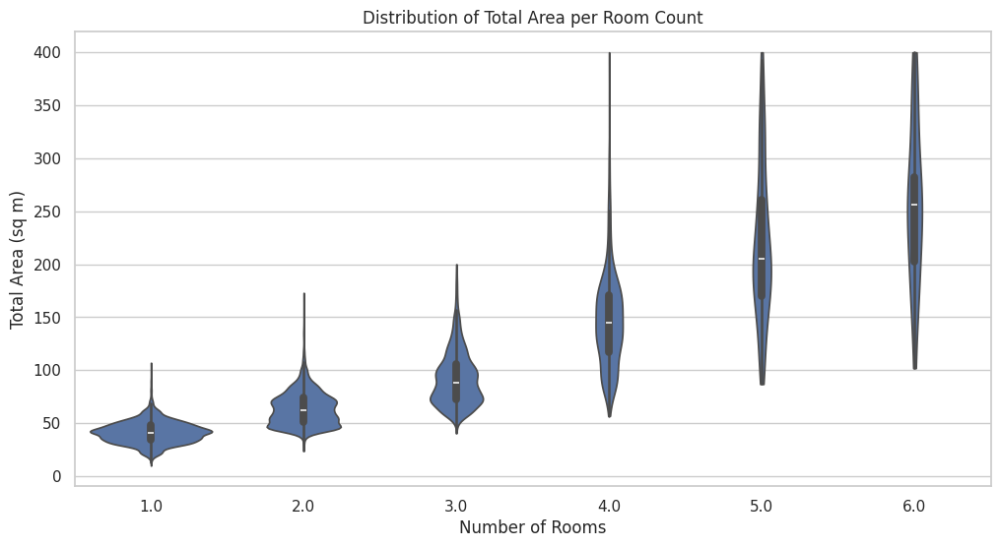

In [ ]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='Rooms', y='Area_total', data=df_num_cleaned, inner='box', cut=0)
plt.title('Distribution of Total Area per Room Count')
plt.xlabel('Number of Rooms')
plt.ylabel('Total Area (sq m)')
plt.show()

out of curiosity, let's check if there is any interesting relation between the Year of Construction and the apartment area or the room count.

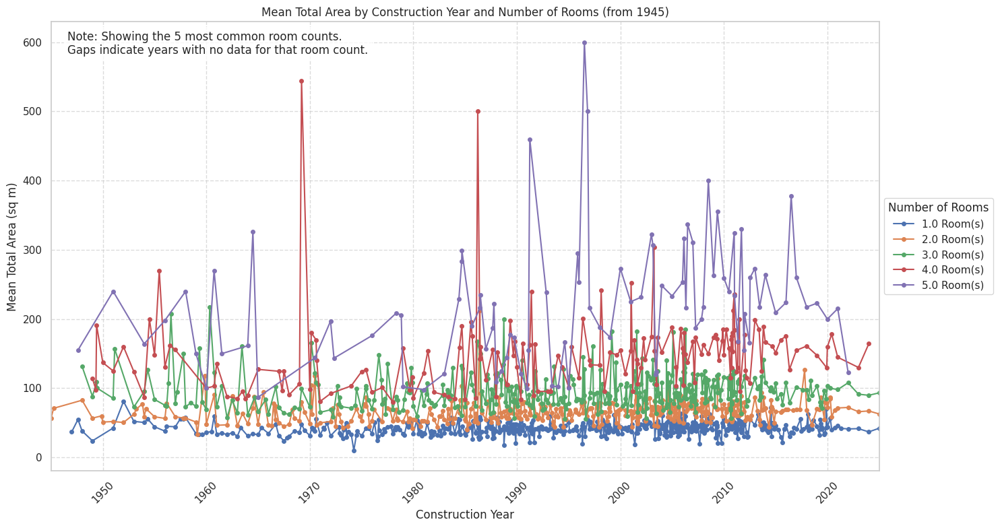


Statistics for 1.0-room apartments (from 1945):
count    501.000000
mean      42.370411
std        9.152400
min       10.000000
25%       36.902222
50%       42.116444
75%       47.660000
max       82.000000
Name: Area_total, dtype: float64

Year with highest mean area for 1.0-room apartments:
Construction Year    2006.105263
Rooms                   1.000000
Area_total             82.000000
Name: 1126, dtype: float64

Year with lowest mean area for 1.0-room apartments:
Construction Year    1974.25
Rooms                   1.00
Area_total             10.00
Name: 232, dtype: float64

--------------------------------------------------

Statistics for 2.0-room apartments (from 1945):
count    430.000000
mean      66.331993
std       14.750645
min       33.000000
25%       56.300000
50%       66.000000
75%       73.518750
max      212.000000
Name: Area_total, dtype: float64

Year with highest mean area for 2.0-room apartments:
Construction Year    1986.4375
Rooms                   2.0000
Ar

In [ ]:
# Filter data from 1945 onwards
df_filtered = df_num[df_num['Construction Year'] >= 1945]

# Group by Construction Year and Rooms, then calculate mean Area_total
grouped_data = df_filtered.groupby(['Construction Year', 'Rooms'])['Area_total'].mean().reset_index()

# Get the 5 most common room counts
common_room_counts = df_filtered['Rooms'].value_counts().nlargest(5).index

# Create the plot
plt.figure(figsize=(15, 8))

# Plot a line for each common room count
for room_count in common_room_counts:
    data = grouped_data[grouped_data['Rooms'] == room_count]
    plt.plot(data['Construction Year'], data['Area_total'],
             label=f'{room_count} Room(s)', marker='o', markersize=4)

# Customize the plot
plt.title('Mean Total Area by Construction Year and Number of Rooms (from 1945)')
plt.xlabel('Construction Year')
plt.ylabel('Mean Total Area (sq m)')
plt.legend(title='Number of Rooms', loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True, linestyle='--', alpha=0.7)

# Set x-axis to start from 1945
plt.xlim(1945, df_filtered['Construction Year'].max())

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add a text box with additional information
info_text = "Note: Showing the 5 most common room counts.\nGaps indicate years with no data for that room count."
plt.text(0.02, 0.98, info_text, transform=plt.gca().transAxes,
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Adjust layout to prevent cutoff of labels
plt.tight_layout()

# Show the plot
plt.show()

# Print some statistics for the common room counts
for room_count in common_room_counts:
    data = grouped_data[grouped_data['Rooms'] == room_count]
    print(f"\nStatistics for {room_count}-room apartments (from 1945):")
    print(data['Area_total'].describe())

    print(f"\nYear with highest mean area for {room_count}-room apartments:")
    print(data.loc[data['Area_total'].idxmax()])

    print(f"\nYear with lowest mean area for {room_count}-room apartments:")
    print(data.loc[data['Area_total'].idxmin()])
    print("\n" + "-"*50)

It looks like the 1 and 2 rooms apartment remain about the same, while bigger apartments grow bigger on average with later year of construction

In [ ]:
# Save the DataFrame to a CSV file
df_num_cleaned.to_csv('/content/drive/MyDrive/Colab Notebooks/df_cleaned.csv', index=False)
print("The cleaned dataset has been saved as 'cleaned_apartment_data.csv' in your current working directory.")

The cleaned dataset has been saved as 'cleaned_apartment_data.csv' in your current working directory.


In [ ]:
print(df_num_cleaned.shape)

(13331, 19)
